In [1]:
import datetime
from datlib.FRED import *
# for each variable, enter the variable name followed by the variable code. 
# the first variable is completed for you
data_codes  = {"10 Year U.S. Treasury Rate":"DGS10",
               "CPI":"CPIAUCSL",
               "GDP":"GDP",
               "Real GDP":"GDPC1",
              "$C_{circ}$":"WCURCIR",
              "Federal Funds Rate": "DFF"
}

start = datetime.datetime(1950, 1, 1)
end = datetime.datetime.today()

data = gather_data(data_codes = data_codes, 
                   start = start, 
                   end = end, 
                   freq = "Q").dropna()
data["V_C"] = data["GDP"].div(data["$C_{circ}$"])
data["Real $C_{circ}$"] = data["$C_{circ}$"].div(data["CPI"])

In [3]:
#gather Divisiadata
divisiaAggregates = pd.read_excel("http://centerforfinancialstability.org/amfm/Divisia.xlsx", header = [1], index_col = [0],
                                  parse_dates=True).resample("Q").first()
dkeys = {'Divisia M4 level, normalized to equal 100 in Jan. 1967': "M4",
   'Divisia M4 year-over-year percentage growth rate':"M4 YoY % Change",
   'M4 interest-rate aggregate, percent per year': "$r_{M4}$", 
   'Divisia M4- level, normalized to equal 100 in Jan. 1967': "M4-",
   'Divisia M4- year-over-year percentage growth rate':"M4- YoY % Change",
   'M4- interest-rate aggregate, percent per year': "$r_{M4-}$", 
   'Divisia M3 level, normalized to equal 100 in Jan. 1967':"M3",
   'Divisia M3 year-over-year percentage growth rate':"M3 YoY Change",
   'M3 interest-rate aggregate, percent per year':"M3 Interest Agg"} 
divisiaAggregates.rename(columns={key:val for key, val in dkeys.items()}, 
                         inplace = True)
for key, val in divisiaAggregates.items():
    data[key] = val.loc["1984":]
data["$V_{M4}$"] = data["M4"].div(data["GDP"])
data["$V_{M4-}$"] = data["M4-"].div(data["GDP"])
data["Real M4"] = data["M4"].div(data["CPI"])
data["Real M4-"] = data["M4-"].div(data["CPI"])

# log_vars = ["Nominal GDP ($ Mil)",
#             "Real GDP ($ Mil)",
#             "GDP Deflator",
#             "CPI",
#             "Base: Total ($ Mil)",
#             "Base: Currency in Circulation ($ Mil)",
#             "Base: Currency not in Circulation ($ Mil)",
#             "Currency in Circulation Velocity",
#             "DM4",
#             "DM4 Velocity",
#             "DM4-",
#             "DM4- Velocity",]

In [4]:
divisiaAggregates

,M4,M4 YoY % Change,$r_{M4}$,Unnamed: 4,M4-,M4- YoY % Change,$r_{M4-}$,Unnamed: 8,M3,M3 YoY Change,M3 Interest Agg,Unnamed: 12,Note: DM4- is DM4 minus Treasury bills; DM3 is DM4- minus commercial papers.,Unnamed: 14,Unnamed: 15
Date,,,,,,,,,,,,,,,
1967-03-31,100.000000,NaN,0.033670,NaN,100.000000,NaN,0.032064,NaN,100.000000,NaN,0.031320,NaN,NaN,NaN,NaN
1967-06-30,101.785238,NaN,0.031249,NaN,101.729316,NaN,0.030399,NaN,101.741173,NaN,0.029912,NaN,NaN,NaN,NaN
1967-09-30,104.261015,NaN,0.032987,NaN,104.227770,NaN,0.031910,NaN,104.265088,NaN,0.031439,NaN,NaN,NaN,NaN
1967-12-31,106.442801,NaN,0.034001,NaN,106.313368,NaN,0.032615,NaN,106.352699,NaN,0.032084,NaN,NaN,NaN,NaN
1968-03-31,108.106767,0.081068,0.035202,NaN,107.921663,0.079217,0.033430,NaN,107.815055,0.078151,0.032703,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31,2117.909611,0.278648,0.000763,NaN,1845.366717,0.192490,0.000718,NaN,1857.360186,0.201174,0.000699,NaN,NaN,NaN,NaN
2021-03-31,2159.011309,0.283127,0.000638,NaN,1886.967759,0.199003,0.000607,NaN,1898.399763,0.207310,0.000575,NaN,NaN,NaN,NaN
2021-06-30,2186.651336,0.122442,0.000483,NaN,1954.796546,0.121684,0.000529,NaN,1960.076451,0.123050,0.000504,NaN,NaN,NaN,NaN


In [5]:
# rate_vars = ["CPI", "Real GDP", "V_C", "M4", "$V_{M4}$", "$r_{M4}$", "$C_{circ}$"]
rate_vars = ["V_C", "M4", "$V_{M4}$", "$r_{M4}$", "$C_{circ}$", "GDP"]

rate_data = data[rate_vars].pct_change(4).mul(100)
interest_vars = ["10 Year U.S. Treasury Rate", "Federal Funds Rate"]
for interest in interest_vars:
    rate_data[interest] = data[interest].diff(4)
#     rate_data["Real " + interest] = rate_data[interest].sub(rate_data["CPI"])
        



In [6]:
from matplotlib.backends.backend_pdf import PdfPages
from datlib.plots import * 
# pp = PdfPages("Inflation and Growth Rate Scatters.pdf")
# plt.rcParams.update({"font.size":32})
# plot_scatter(data[rate_vars + interest_vars], save_fig=True, pp = pp)
# pp.close()

C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = figsize)


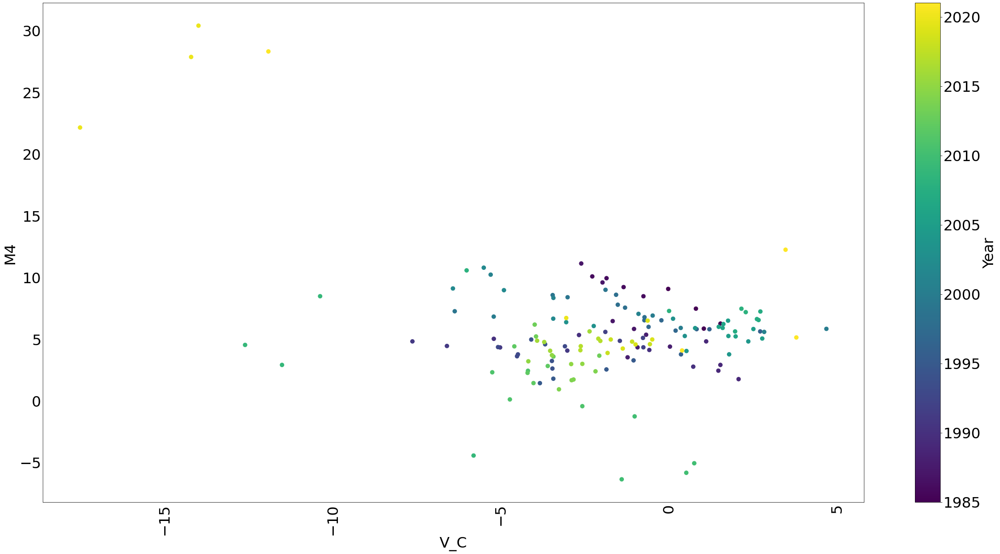

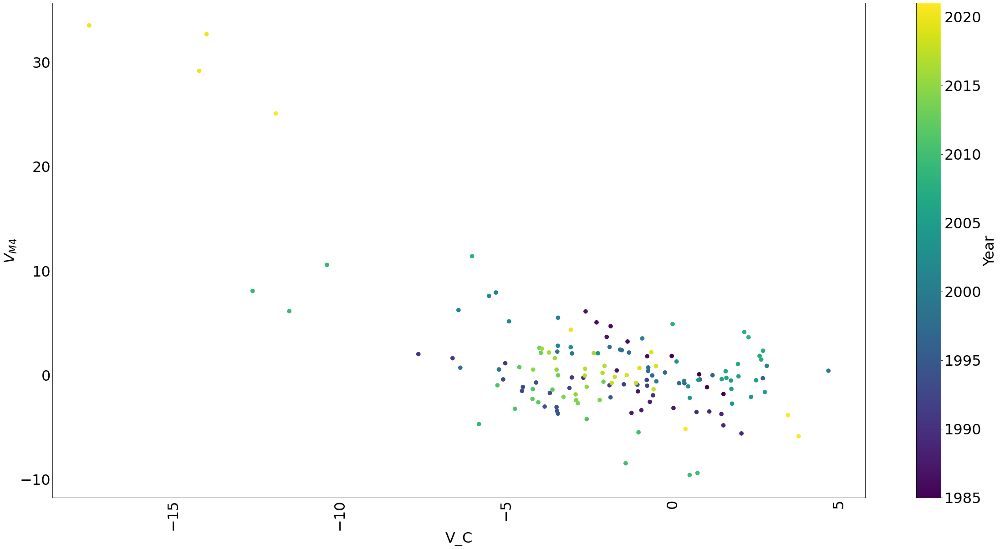

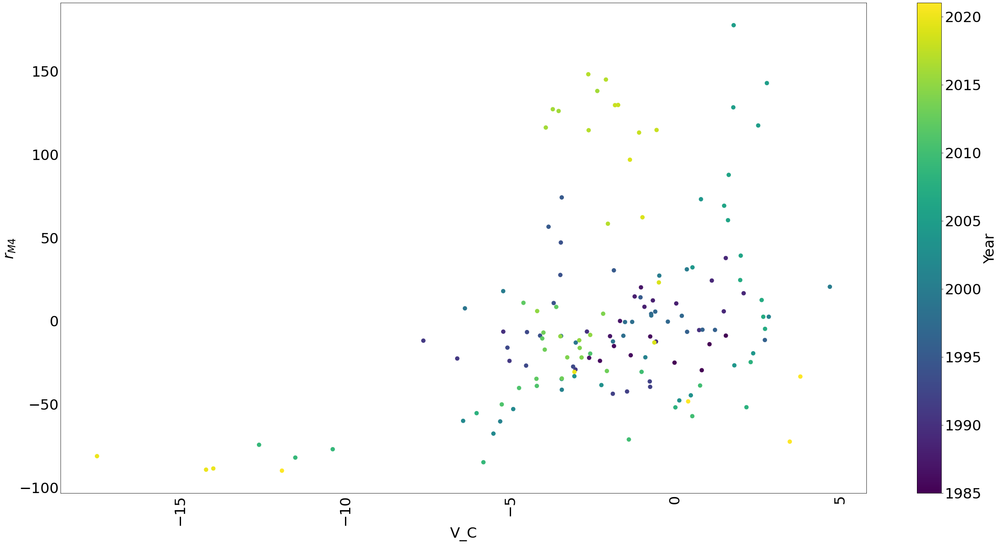

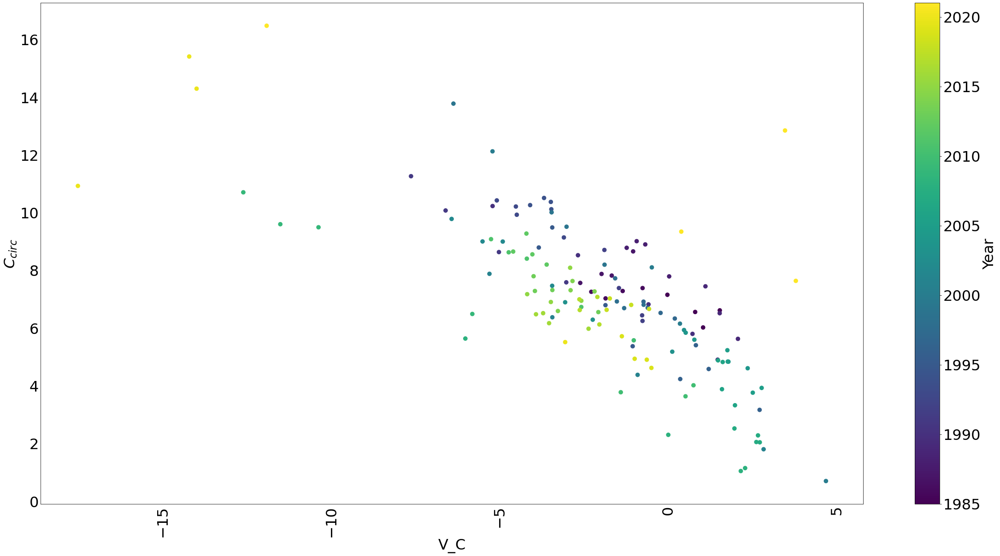

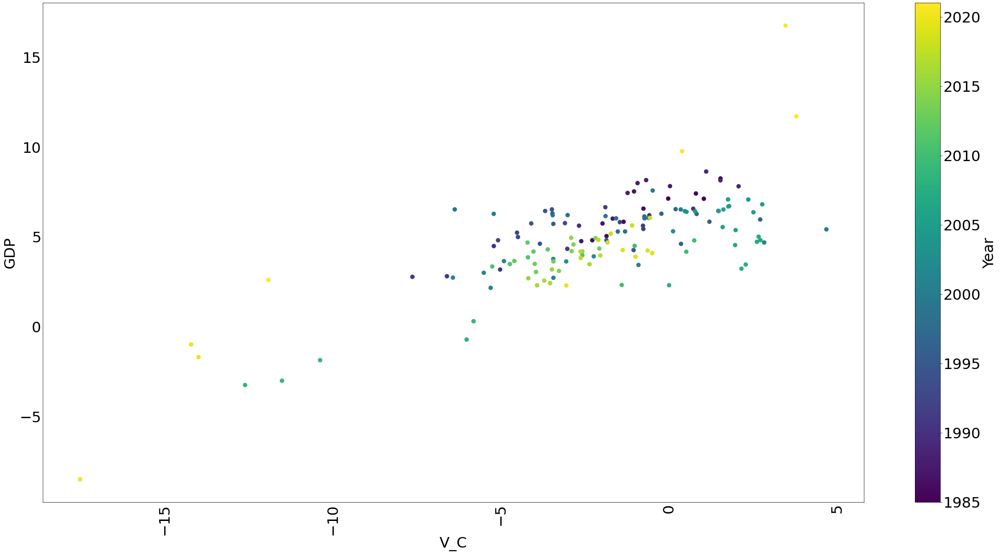

...

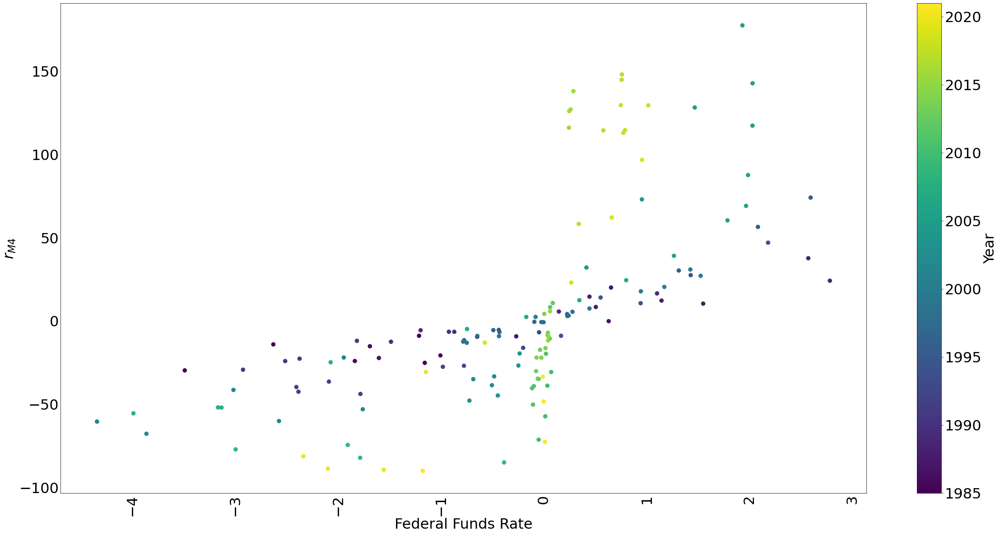

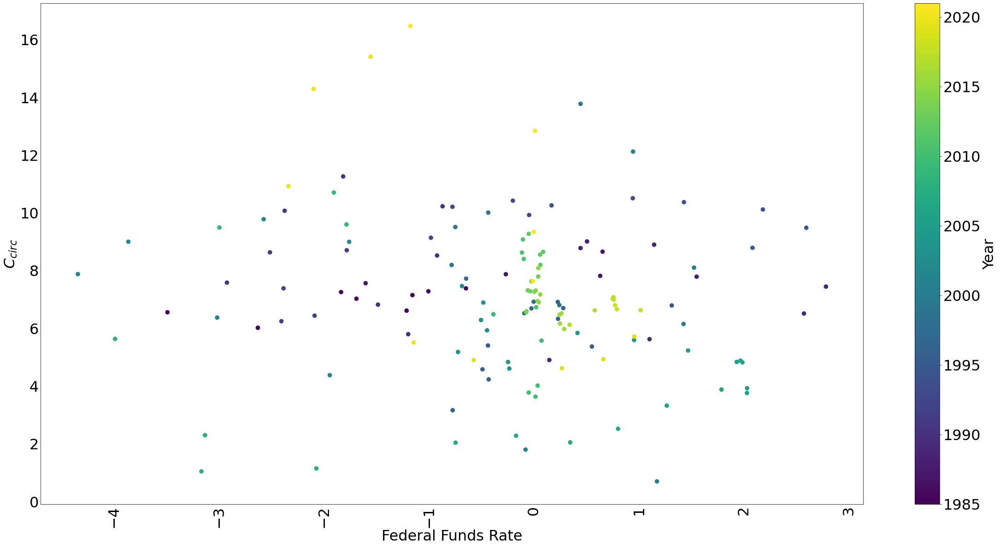

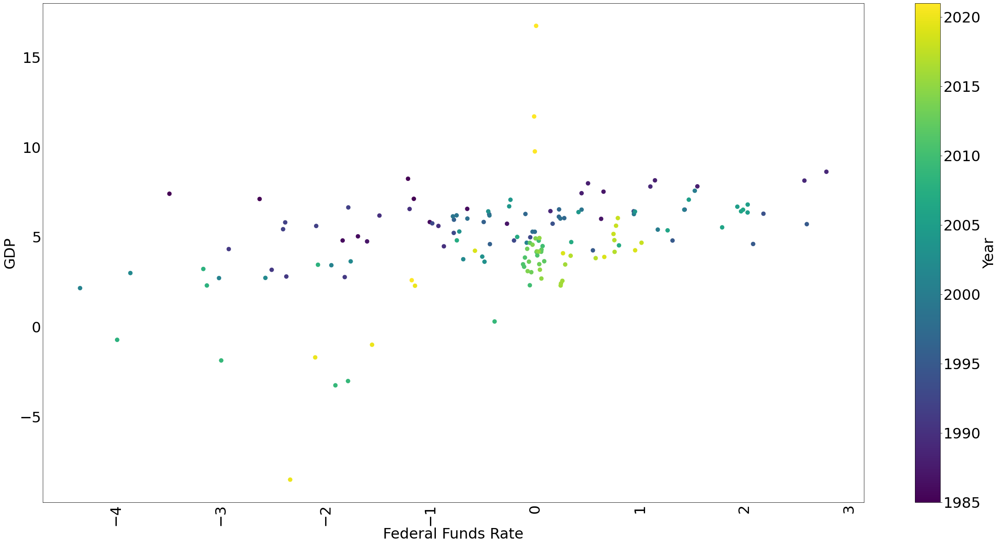

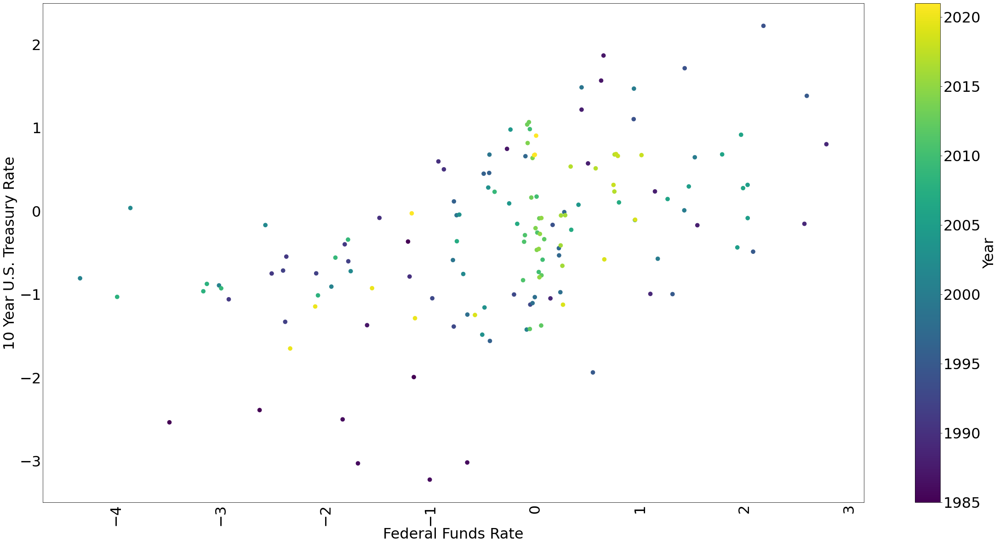

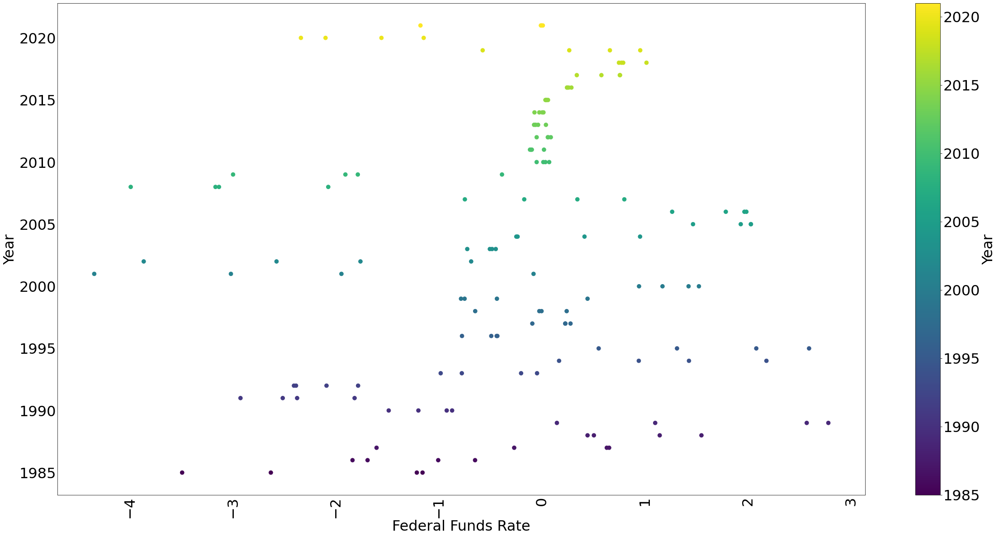

In [7]:
from matplotlib.backends.backend_pdf import PdfPages
from datlib.plots import * 
pp = PdfPages("Inflation and Growth Rate Scatters.pdf")
plt.rcParams.update({"font.size":32})
plot_scatter(rate_data, save_fig=True, pp = pp)
pp.close()

C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = figsize)


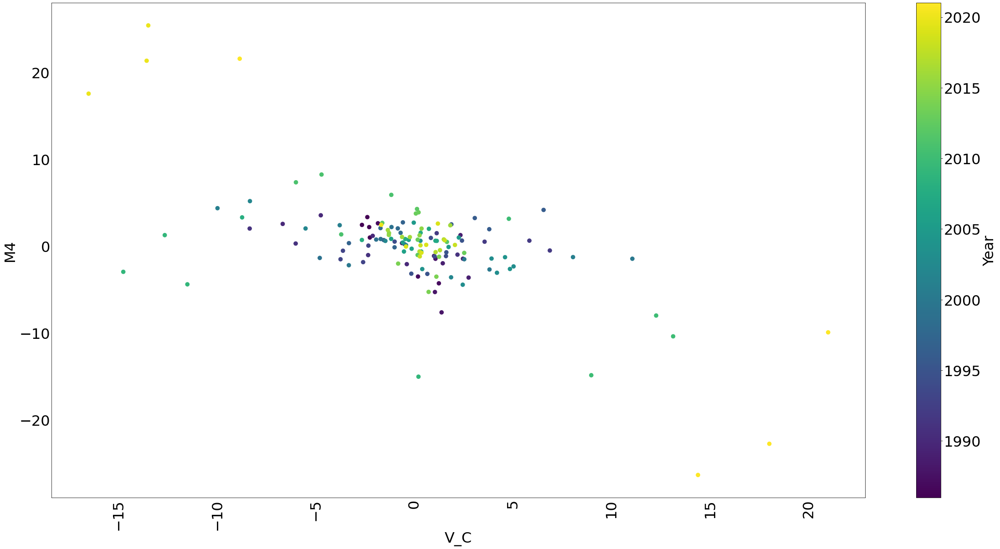

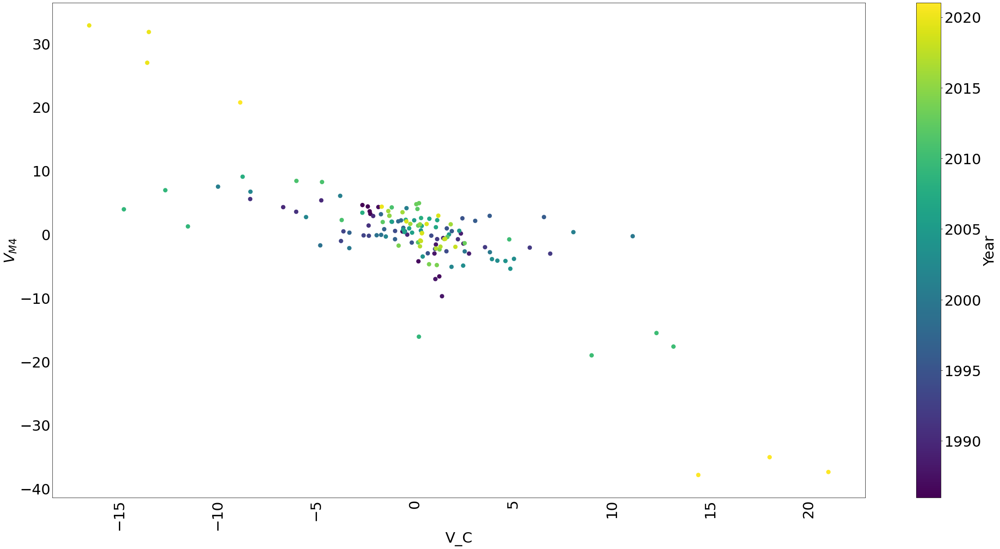

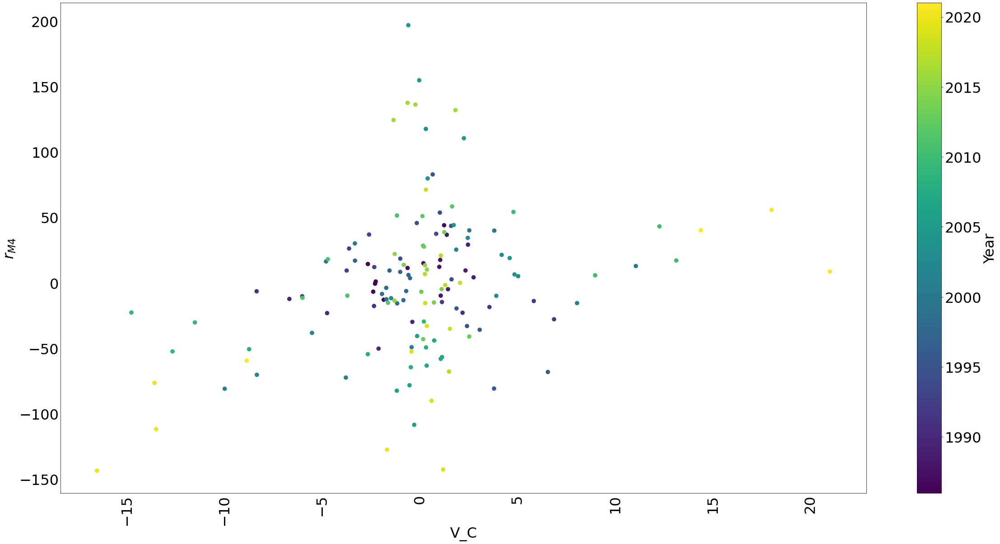

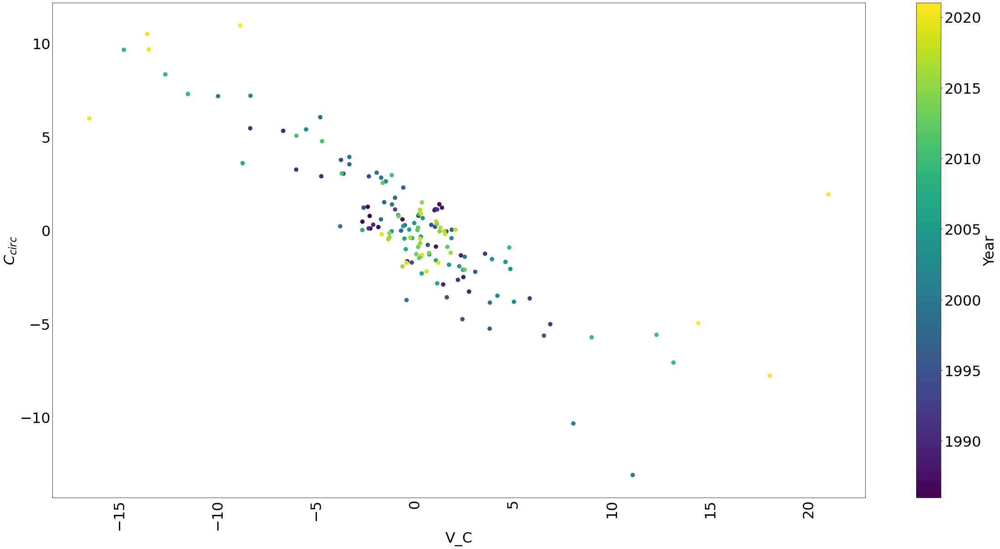

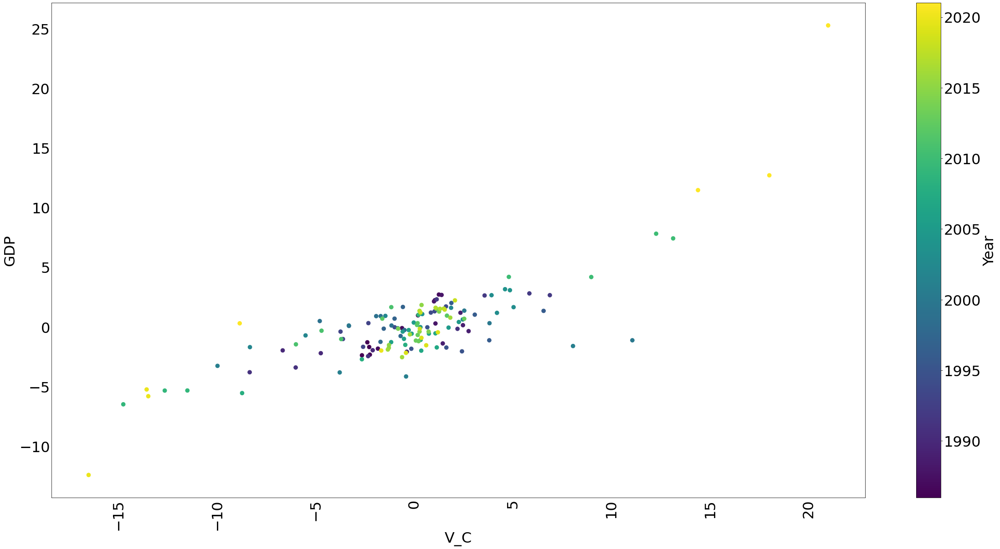

...

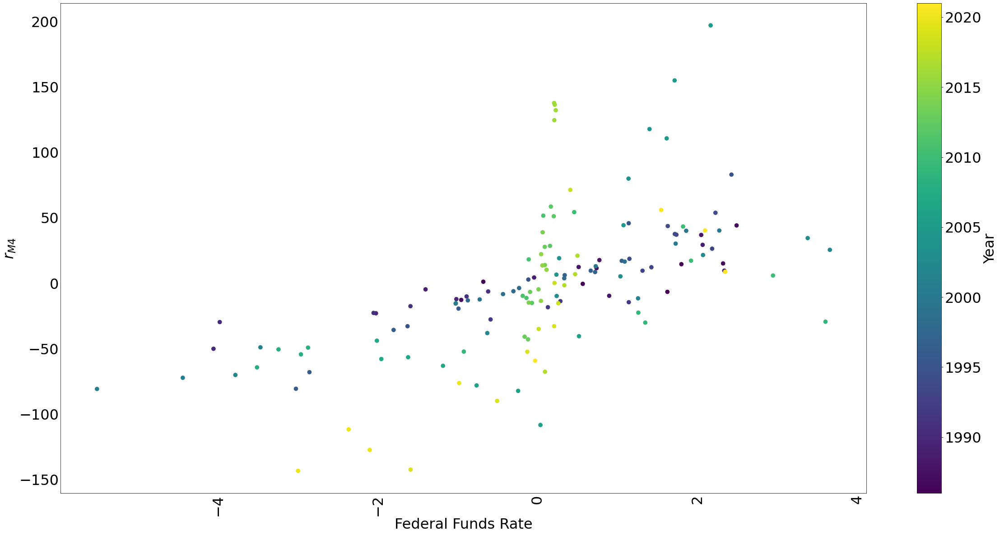

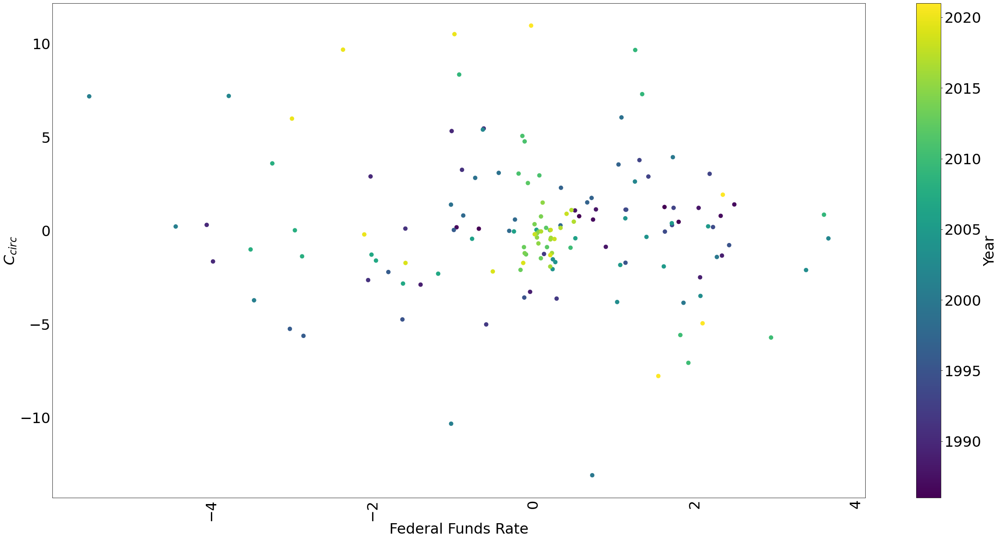

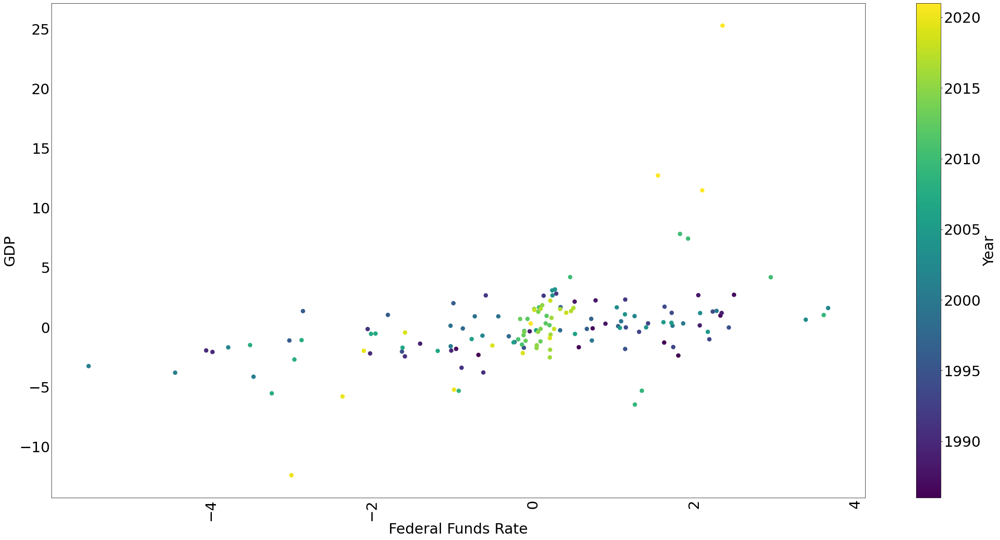

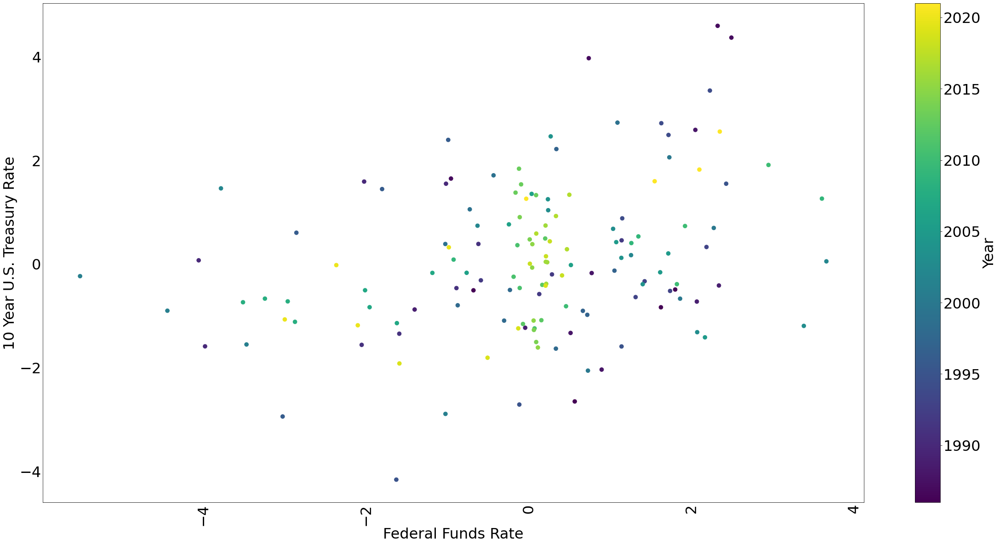

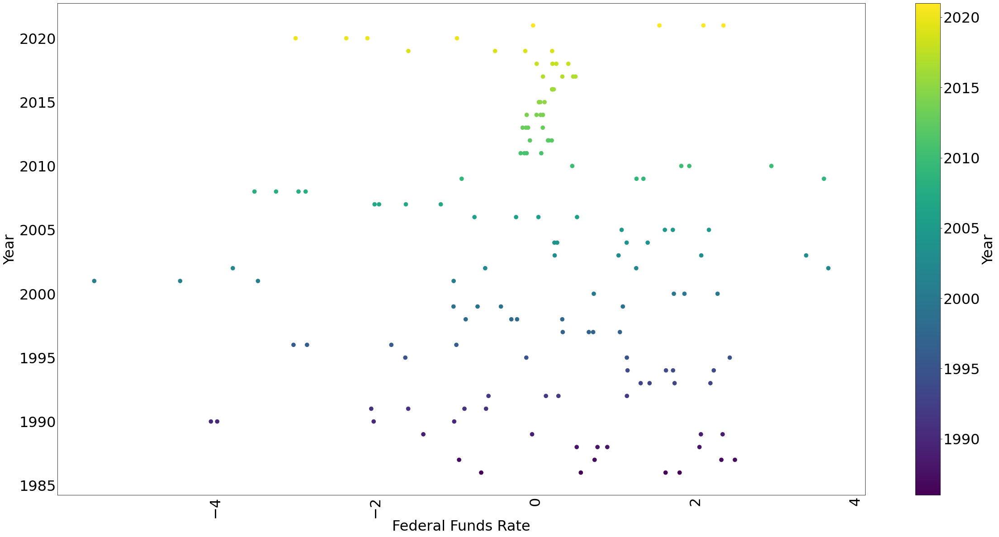

In [8]:
from matplotlib.backends.backend_pdf import PdfPages
from datlib.plots import * 
pp = PdfPages("Inflation and Growth Rate Scatters.pdf")
plt.rcParams.update({"font.size":32})
plot_scatter(rate_data.diff(4), save_fig=True, pp = pp)
pp.close()

In [9]:
import pingouin
from pgmpy.estimators import PC
import matplotlib.pyplot as plt
from matplotlib.patches import ArrowStyle
from networkx.drawing.nx_agraph import graphviz_layout
import warnings
warnings.filterwarnings("ignore")
from matplotlib.backends.backend_pdf import PdfPages
import networkx as nx

def firstLetterWord(str, num_chars = 3):
 
    result = ""
 
    # Traverse the string.
    v = True
    for i in range(len(str)):
         
        # If it is space, set v as true.
        if (str[i] == ' '):
            v = True
 
        # Else check if v is true or not.
        # If true, copy character in output
        # string and set v as false.
        elif (str[i] != ' ' and v == True):
            result += (str[i:i+num_chars])
            v = False
 
    return result

def graph_DAG(edges, data_reg, title = "", 
              fig = False, ax = False, 
              edge_labels = False,sig_vals = [0.05, 0.01, 0.001]):
    pcorr = data_reg.pcorr()
    graph = nx.DiGraph()
    def build_edge_labels(edges, df, sig_vals):
        edge_labels = {}
        for edge in edges:
            controls = [key for key in df.keys() if key not in edge]
            controls = list(set(controls))
            keep_controls = []
            for control in controls:
                control_edges = [ctrl_edge for ctrl_edge in edges if control == ctrl_edge[0] ]
                if (control, edge[1]) in control_edges:
                    keep_controls.append(control)                
#             print(edge, keep_controls)
            pcorr = df.partial_corr(x = edge[0], y = edge[1], covar=keep_controls,
                                  method = "pearson")
            label = str(round(pcorr["r"][0],2))
            pvalue = pcorr["p-val"][0]
#             pcorr = df[[edge[0], edge[1]]+keep_controls].pcorr()
#             label = pcorr[edge[0]].loc[edge[1]]

            for sig_val in sig_vals:
                if pvalue < sig_val: 
                    label = label + "*"   
            
            edge_labels[edge] = label
            print(edge_labels)
        return edge_labels
    
    if edge_labels == False:
        edge_labels = build_edge_labels(edges, 
                                        data_reg, 
                                        sig_vals=sig_vals) 
    print(edge_labels)   
    graph.add_edges_from(edges)
    color_map = ["grey" for g in graph]

    if fig == False and ax == False: 
        fig, ax = plt.subplots(figsize = (20,12))
        a = ax
    graph.nodes()
    plt.tight_layout()
    pos = graphviz_layout(graph)

    edge_labels2 = []
    for u, v, d in graph.edges(data=True):
        if pos[u][0] > pos[v][0]:  
            if (v,u) in edge_labels.keys():
                edge_labels2.append(((u, v,), f'{edge_labels[u,v]}\n\n\n{edge_labels[(v,u)]}'))  
        if (v,u) not in edge_labels.keys():
            edge_labels2.append(((u,v,), f'{edge_labels[(u,v)]}'))
    edge_labels = dict(edge_labels2)

    nx.draw_networkx(graph, pos, node_color=color_map, node_size = 2500,
                     with_labels=True,  arrows=True,
                     font_color = "black",
                     font_size = 26, alpha = 1,
                     width = 1, edge_color = "C1",
                     arrowstyle=ArrowStyle("Fancy, head_length=3, head_width=1.5, tail_width=.1"),
                     connectionstyle='arc3, rad = 0.05',
                     ax = a)
    nx.draw_networkx_edge_labels(graph,pos,
                                 edge_labels=edge_labels,
                                 font_color='green',
                                 font_size=20,
                                ax = a)


C:\Users\JLCat\AppData\Roaming\Python\Python38\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.4.0, the latest is 0.5.0.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


Working for n conditional variables: 2: 100%|████████████████████████████████████████████| 2/2 [00:00<00:00,  8.39it/s]


{('FedFunRat', 'GDP'): '0.26**'}
{('FedFunRat', 'GDP'): '0.26**', ('FedFunRat', 'M4'): '-0.26**'}
{('FedFunRat', 'GDP'): '0.26**', ('FedFunRat', 'M4'): '-0.26**', ('FedFunRat', '$r_'): '0.6***'}
{('FedFunRat', 'GDP'): '0.26**', ('FedFunRat', 'M4'): '-0.26**', ('FedFunRat', '$r_'): '0.6***', ('GDP', 'FedFunRat'): '0.2*'}
{('FedFunRat', 'GDP'): '0.26**', ('FedFunRat', 'M4'): '-0.26**', ('FedFunRat', '$r_'): '0.6***', ('GDP', 'FedFunRat'): '0.2*', ('GDP', 'M4'): '-0.48***'}
{('FedFunRat', 'GDP'): '0.26**', ('FedFunRat', 'M4'): '-0.26**', ('FedFunRat', '$r_'): '0.6***', ('GDP', 'FedFunRat'): '0.2*', ('GDP', 'M4'): '-0.48***', ('M4', 'FedFunRat'): '-0.21*'}
{('FedFunRat', 'GDP'): '0.26**', ('FedFunRat', 'M4'): '-0.26**', ('FedFunRat', '$r_'): '0.6***', ('GDP', 'FedFunRat'): '0.2*', ('GDP', 'M4'): '-0.48***', ('M4', 'FedFunRat'): '-0.21*', ('M4', 'GDP'): '-0.48***'}
{('FedFunRat', 'GDP'): '0.26**', ('FedFunRat', 'M4'): '-0.26**', ('FedFunRat', '$r_'): '0.6***', ('GDP', 'FedFunRat'): '0.2*', 

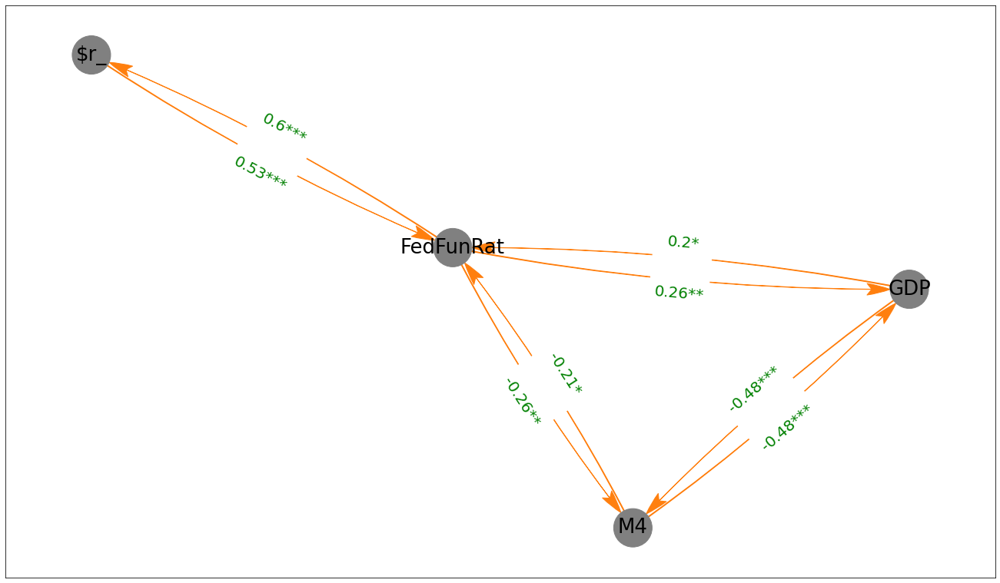

In [10]:
# rate_vars = ["CPI", "Nominal GDP", "V_C", "M4", "$V_{M4}$", "$r_{M4}$", "Real M4"]
rate_vars = ["$r_{M4}$", "M4","Federal Funds Rate", "GDP"]#"Federal Funds Rate",
keys = rate_vars
data_reg = rate_data[rate_vars].diff(4).dropna()
data_reg.rename(columns = {col:firstLetterWord(col) for col in keys}, inplace = True)
keys = data_reg.keys()
max_cond_vars = len(keys) - 2
c = PC(data_reg[keys].dropna())
algorithm = "parallel"
sig = .2
model = c.estimate(return_type = "pdag", variant = algorithm, 
                           significance_level = sig, 
                           max_cond_vars = max_cond_vars, ci_test = "pearsonr")
edges = model.edges()
pcorr = data_reg.pcorr()
weights = {}
graph_DAG(edges, data_reg)


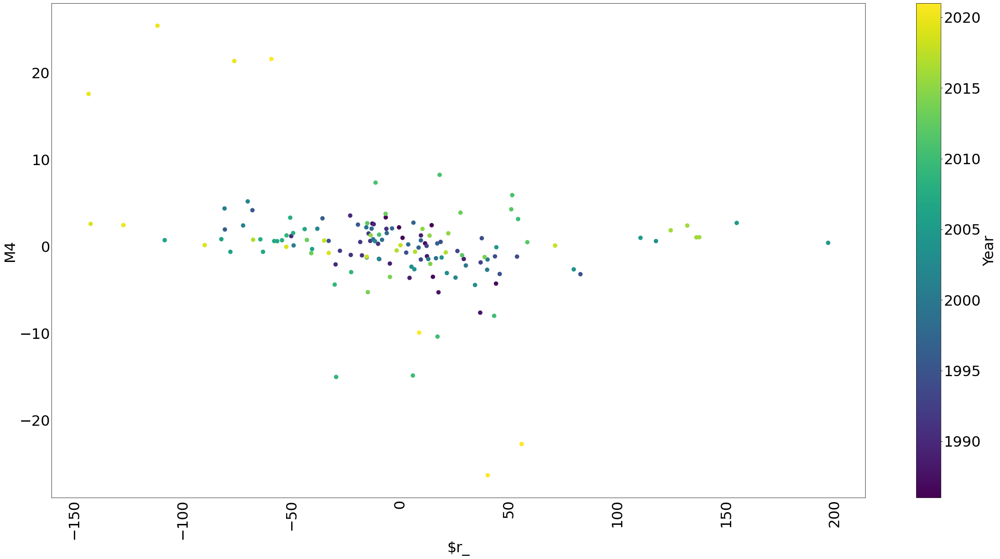

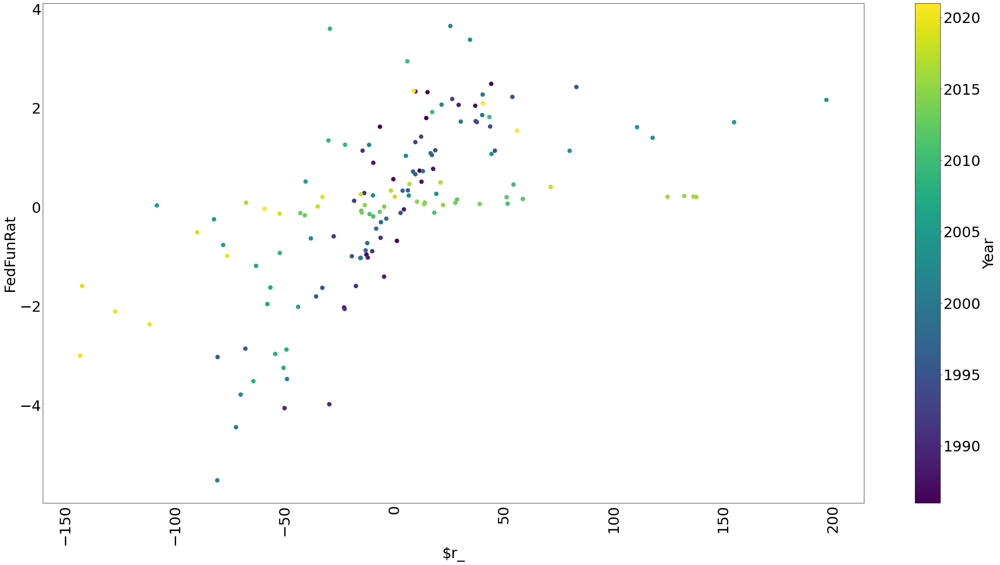

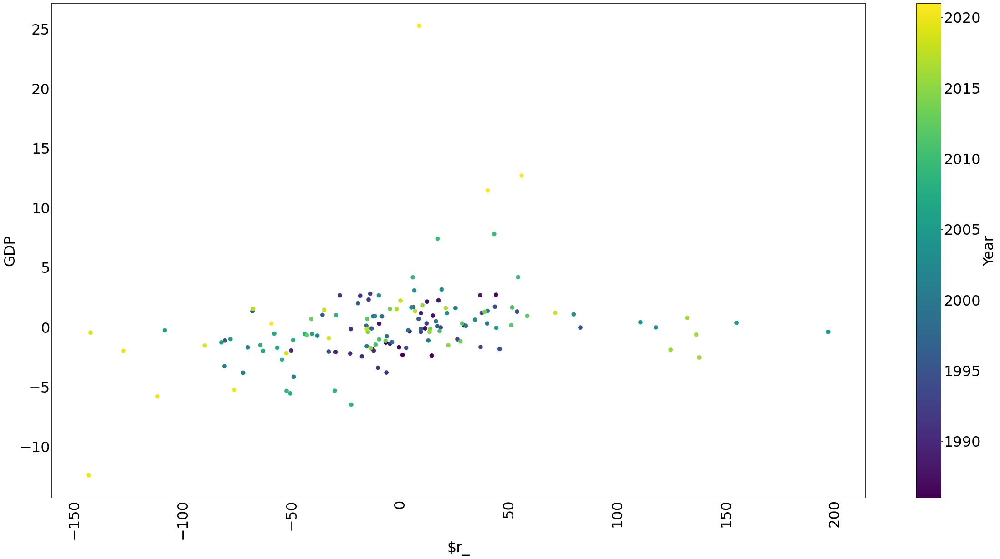

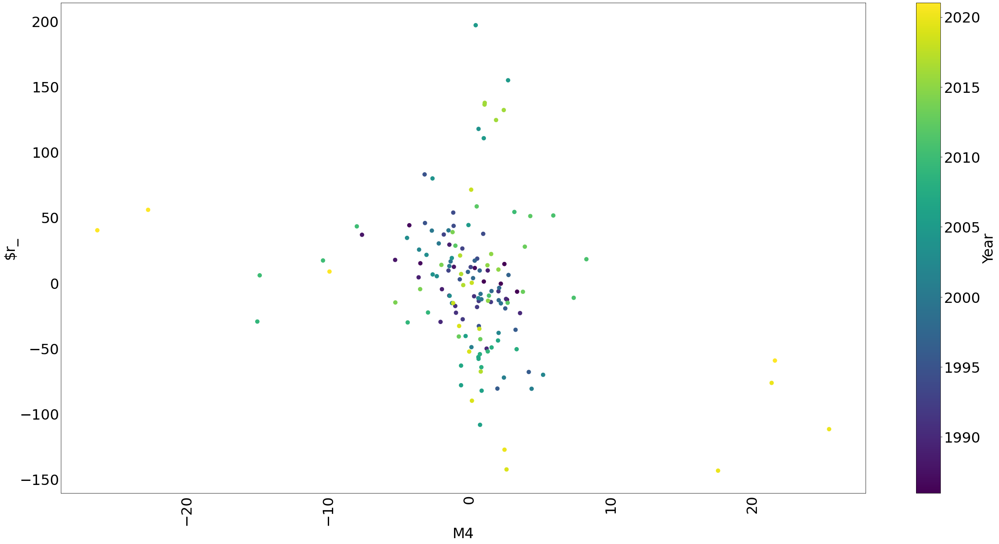

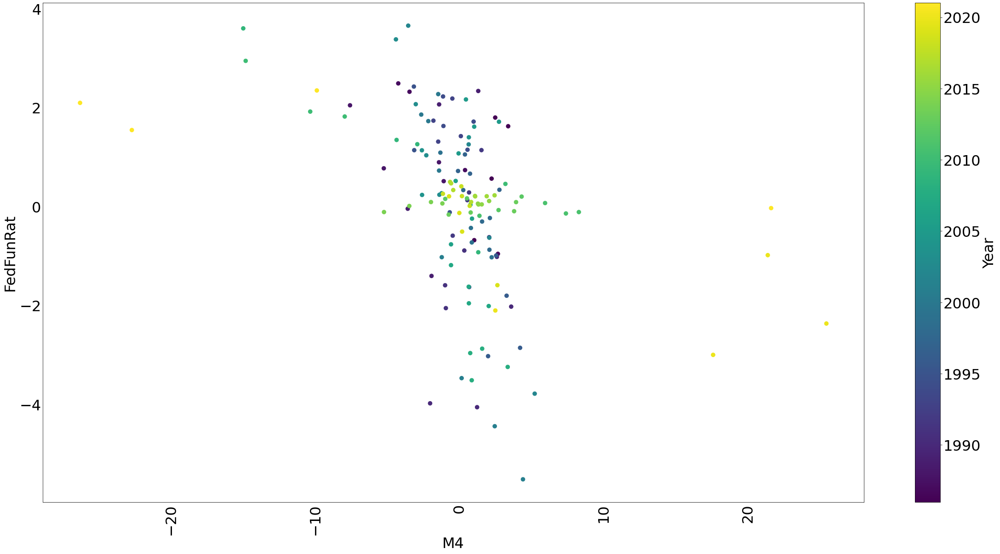

...

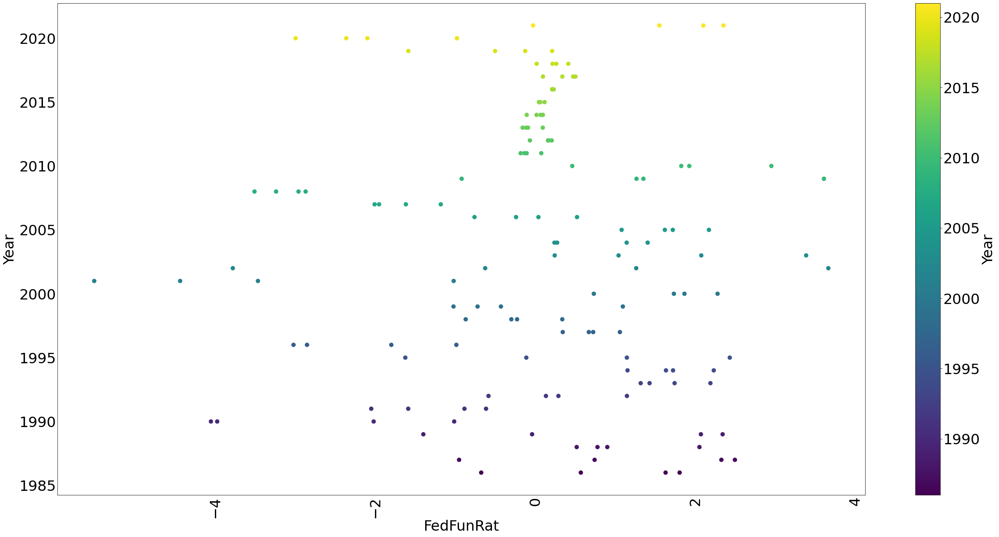

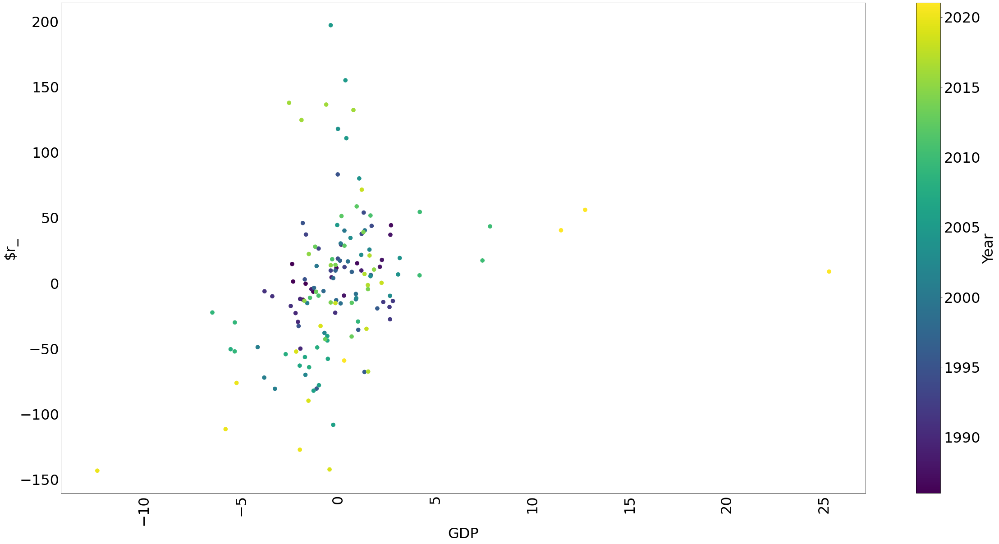

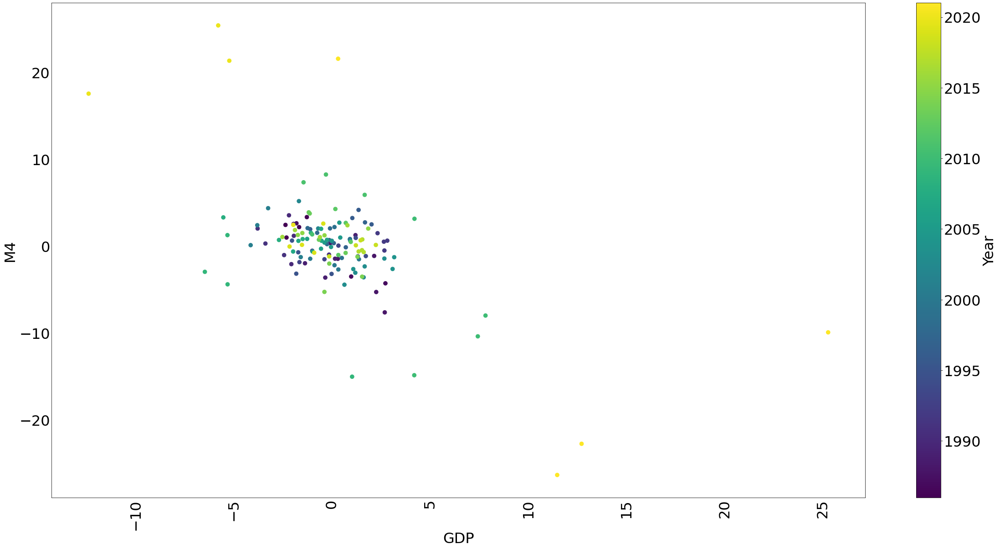

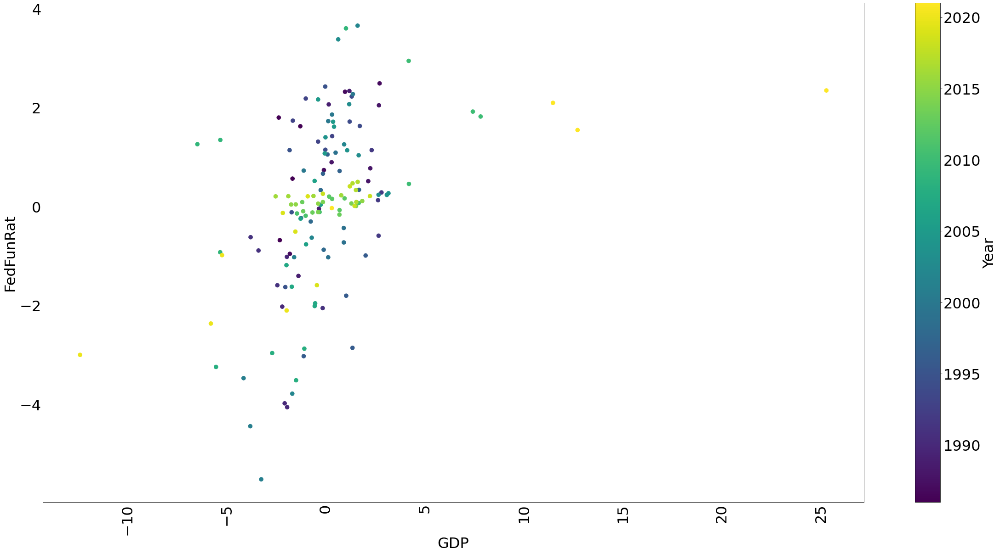

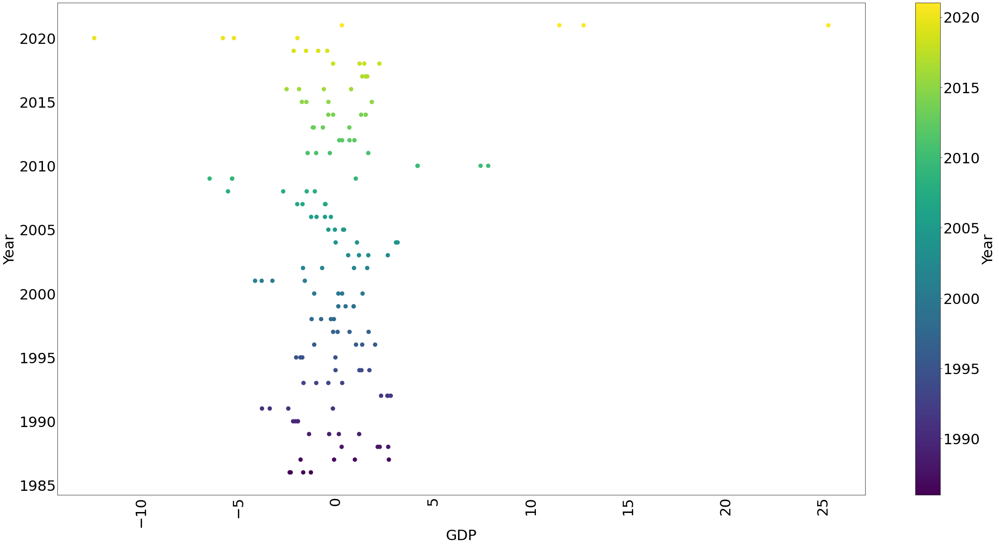

In [11]:
plot_scatter(data_reg)

Working for n conditional variables: 2: 100%|████████████████████████████████████████████| 2/2 [00:00<00:00, 10.34it/s]


{('M4', 'GDP'): '-0.58***'}
{('M4', 'GDP'): '-0.58***', ('GDP', '$r_'): '0.31***'}
{('M4', 'GDP'): '-0.58***', ('GDP', '$r_'): '0.31***', ('$r_', 'M4'): '-0.25**'}
{('M4', 'GDP'): '-0.58***', ('GDP', '$r_'): '0.31***', ('$r_', 'M4'): '-0.25**', ('$C_', 'M4'): '0.5***'}
{('M4', 'GDP'): '-0.58***', ('GDP', '$r_'): '0.31***', ('$r_', 'M4'): '-0.25**', ('$C_', 'M4'): '0.5***'}


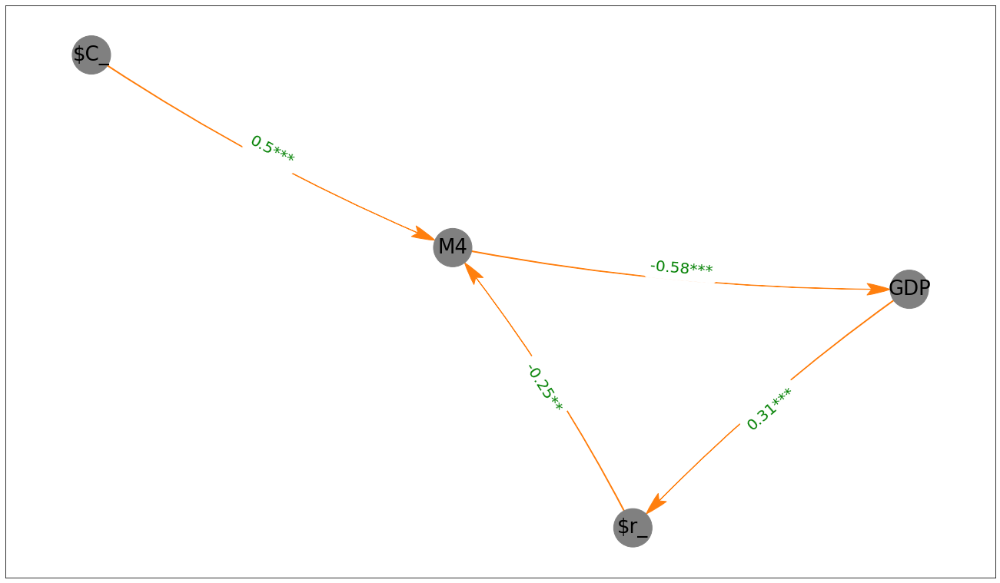

In [31]:
# rate_vars = ["CPI", "Nominal GDP", "V_C", "M4", "$V_{M4}$", "$r_{M4}$", "Real M4"]
rate_vars = ["GDP",  "$C_{circ}$", "M4","$r_{M4}$"]
keys = rate_vars
data_reg = rate_data[rate_vars].diff(4).dropna()
data_reg.rename(columns = {col:firstLetterWord(col) for col in keys}, inplace = True)
keys = data_reg.keys()
max_cond_vars = len(keys) - 2
c = PC(data_reg[keys].dropna())
algorithm = "parallel"
sig = .2
model = c.estimate(return_type = "pdag", variant = algorithm, 
                           significance_level = sig, 
                           max_cond_vars = max_cond_vars, ci_test = "pearsonr")
edges = model.edges()
pcorr = data_reg.pcorr()
weights = {}
graph_DAG(edges, data_reg)


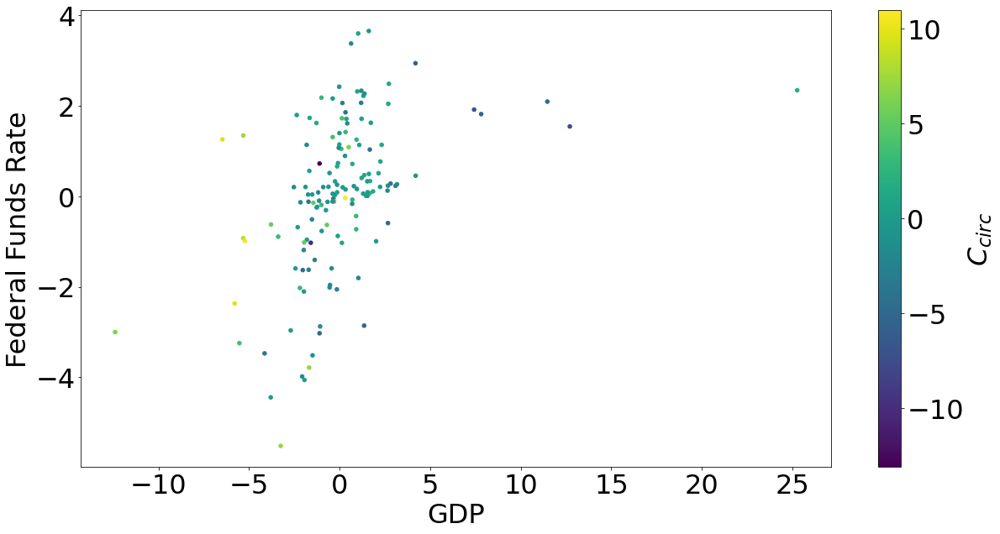

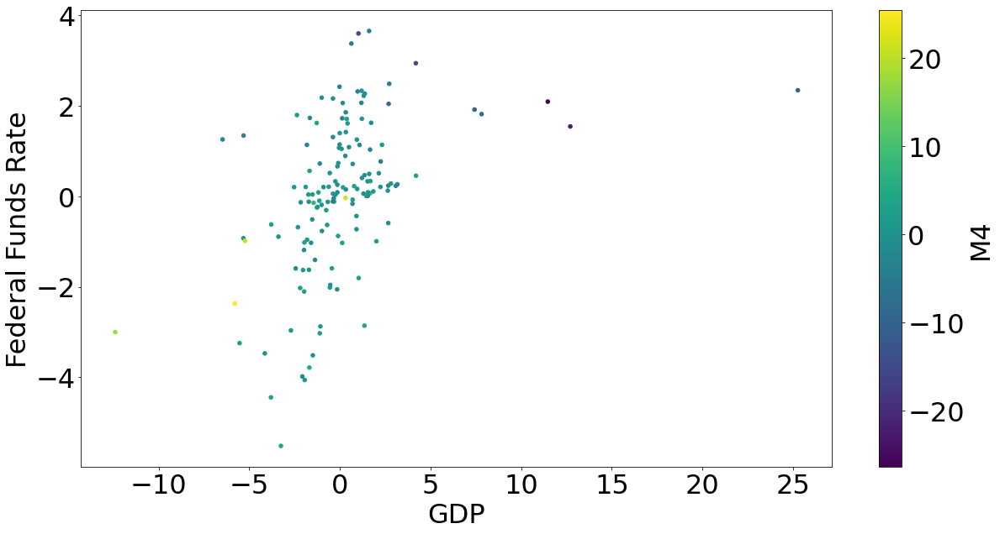

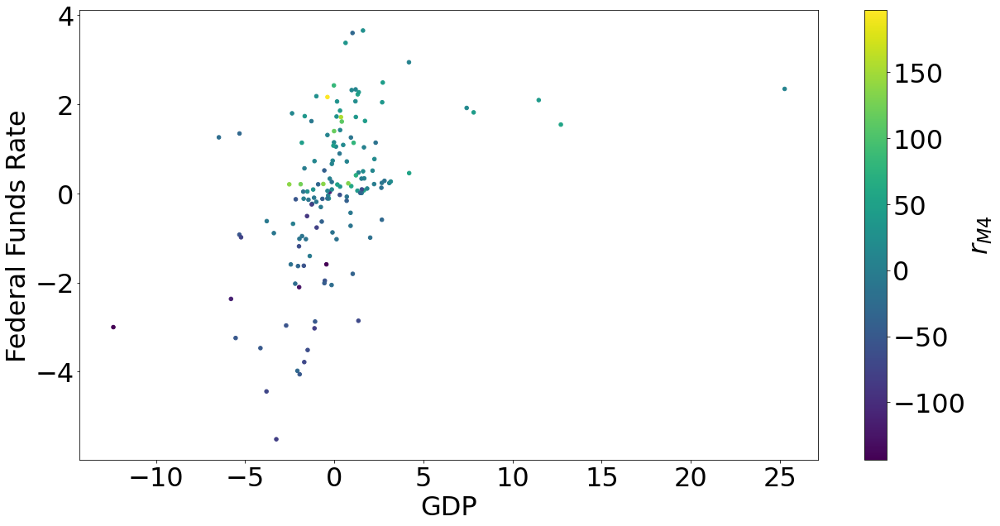

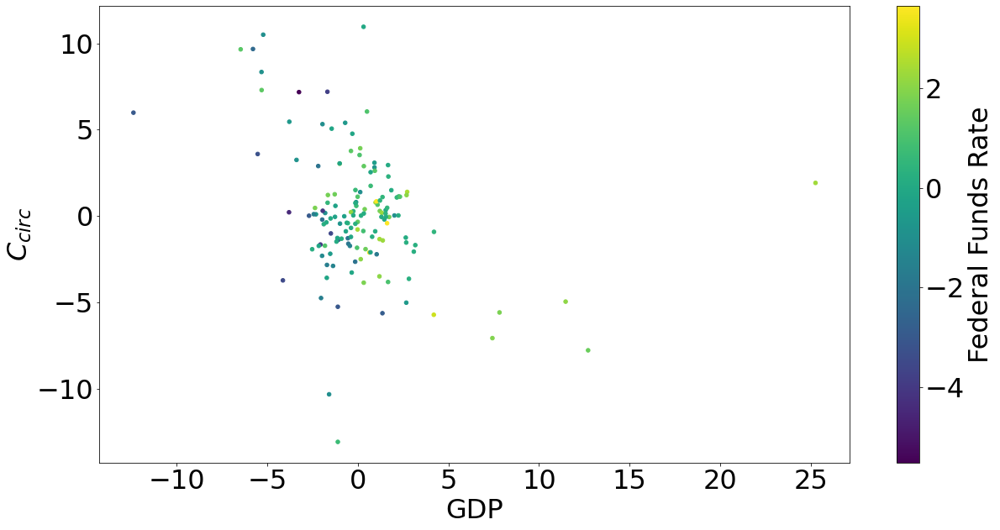

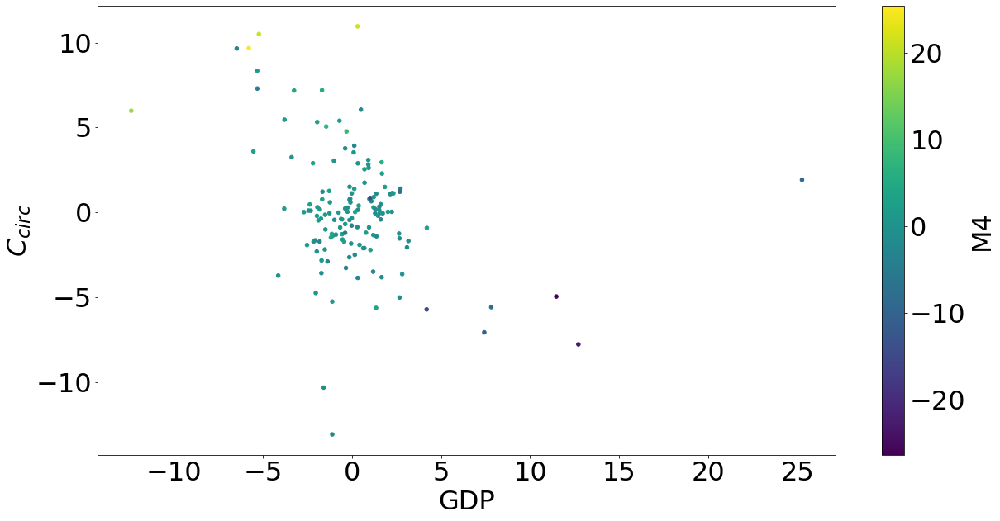

...

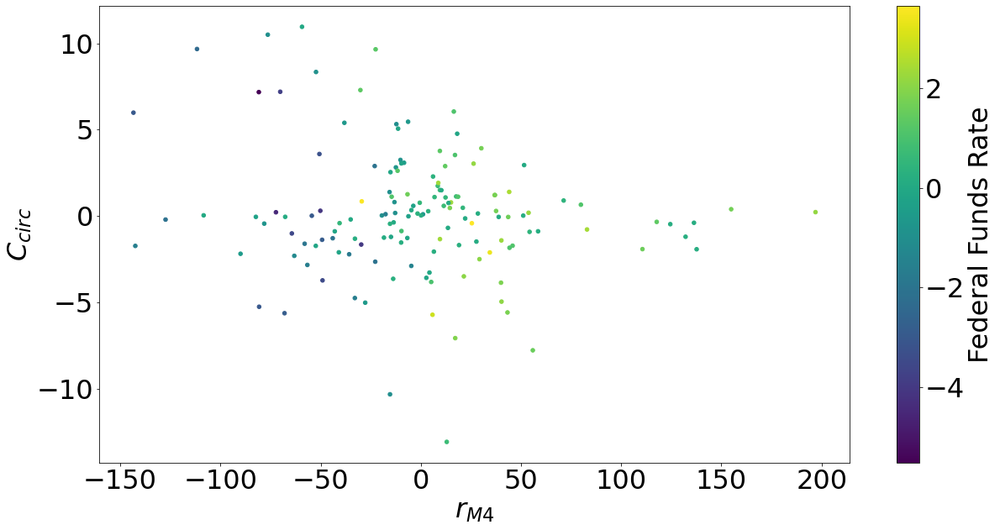

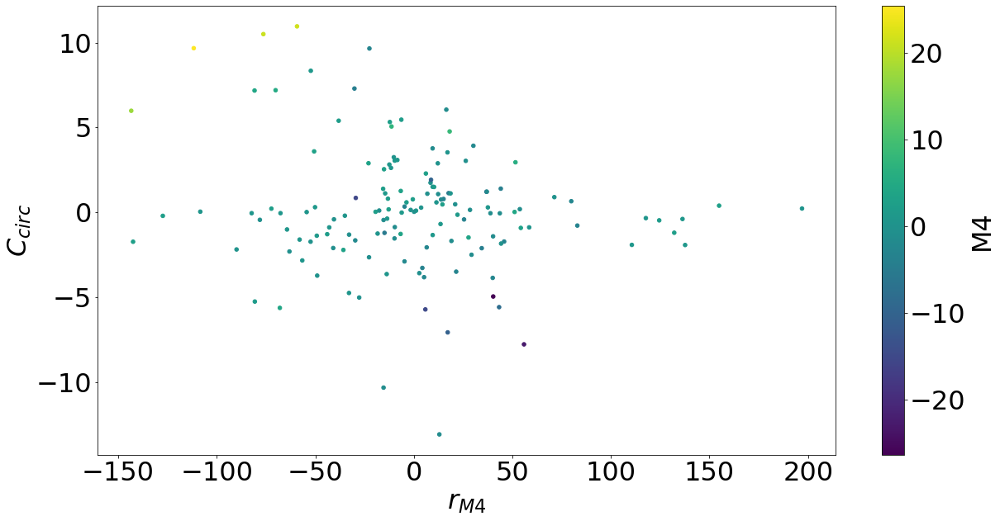

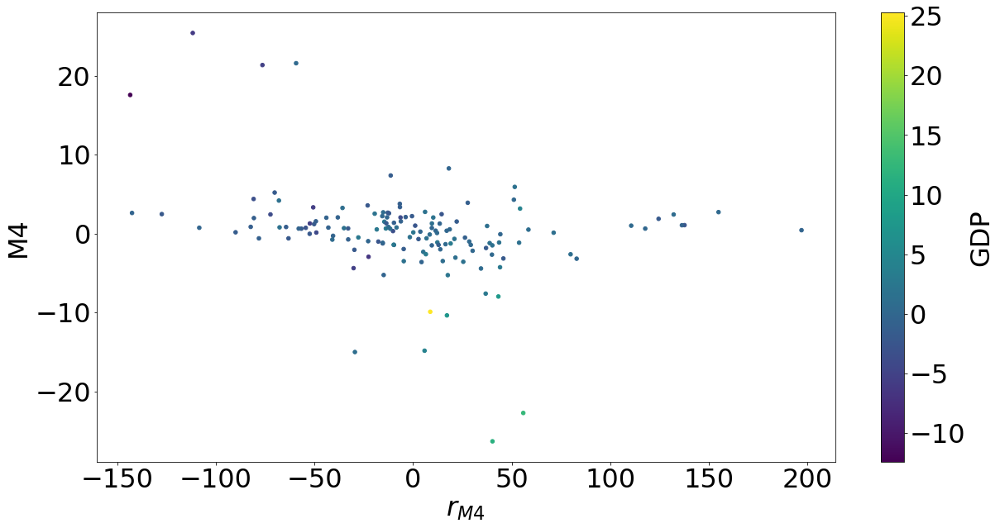

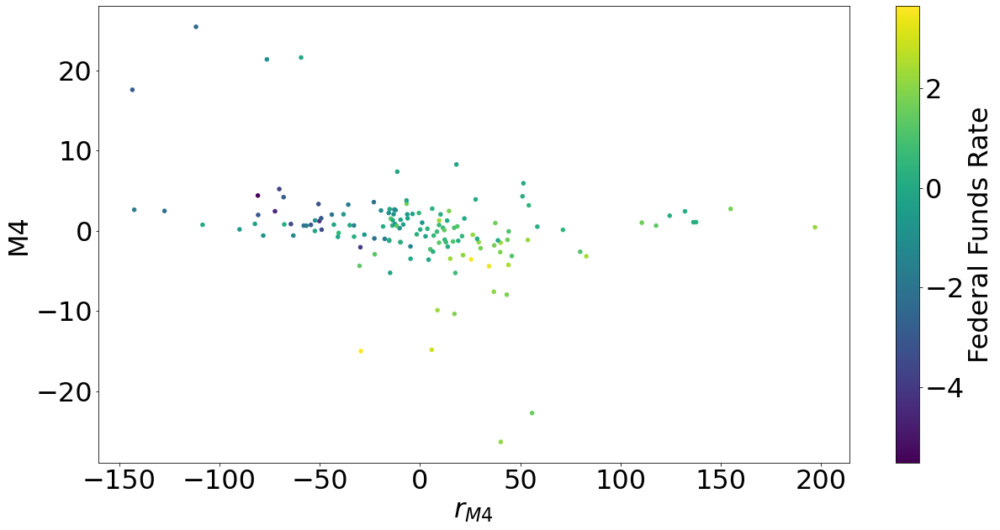

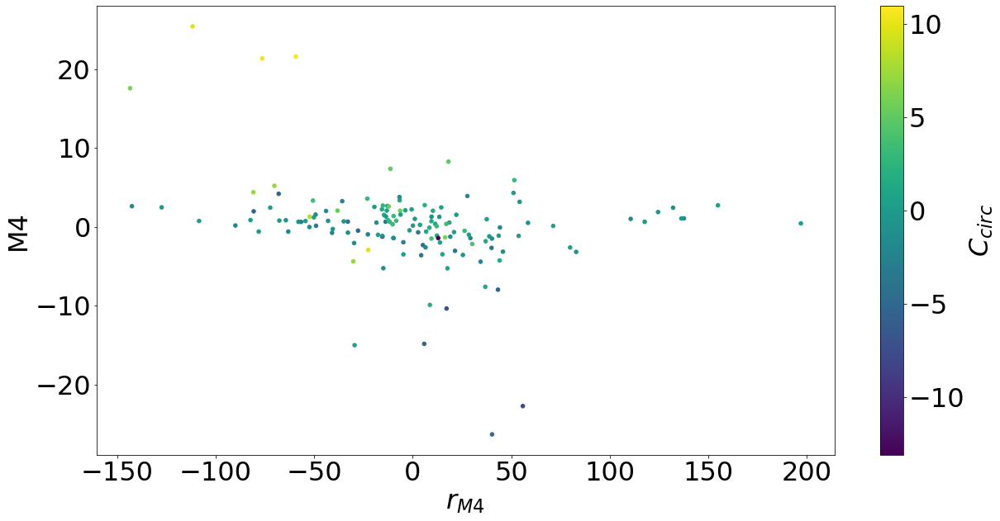

In [18]:
rate_vars = ["GDP", "Federal Funds Rate",  "$C_{circ}$", "M4","$r_{M4}$"]
keys = rate_vars
data_reg = rate_data[rate_vars].diff(4).dropna()

for key1 in data_reg:
    for key2 in data_reg:
        if key1 != key2:
            for key3 in data_reg:
                if key1 != key3 and key2 != key3:
                    fig, ax = plt.subplots(figsize = (20,10))
                    data_reg.plot.scatter(x = key1, 
                                          y = key2, 
                                          c = key3, 
                                          cmap = "viridis", 
                                          ax = ax)

In [24]:
data_reg.pcorr()

,GDP,Federal Funds Rate,$C_{circ}$,M4,$r_{M4}$
GDP,1.000000,0.213746,-0.094667,-0.380457,0.024461
Federal Funds Rate,0.213746,1.000000,0.220141,-0.277982,0.540218
$C_{circ}$,-0.094667,0.220141,1.000000,0.450175,-0.125722
M4,-0.380457,-0.277982,0.450175,1.000000,0.035582
$r_{M4}$,0.024461,0.540218,-0.125722,0.035582,1.000000
